# **Project 47: Census Income Predictor**

***pandas*** : *A powerful data manipulation and analysis library used for handling structured data.*

***warnings*** : *A module for managing and controlling warning messages in code execution.*

***plotly.express*** : *A high-level plotting library for creating interactive visualizations easily.*

***matplotlib.pyplot*** : *A plotting library for creating static, 2D visualizations like line graphs and histograms.*

***seaborn*** : *A statistical data visualization library built on top of matplotlib, providing an easy interface for creating complex plots.*

***numpy*** : *A library for numerical computing, primarily used for handling arrays and performing mathematical operations.*

# **Data Loading**

**We import these libraries for Data Loading, Data Cleaning, and Data Visualization and EDA (Explorotory Data Analysis).**

In [ ]:
import pandas as pd
import warnings
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

**The command !pip install s3fs installs the s3fs library, which enables Python to interact with Amazon S3 storage, allowing seamless reading and writing of data from S3 buckets.**

In [ ]:
!pip install s3fs

**The command warnings.simplefilter("ignore") is used to suppress or ignore warning messages in Python, preventing them from being displayed during the execution of code.**

In [ ]:
warnings.simplefilter("ignore")

**This code reads the adult.data file from an S3 bucket into a Pandas DataFrame using anonymous access. It also sets display options to show all columns and rows, and then displays the first five rows of the dataset.**

In [ ]:
s3_url = "s3://bucket-census/adult.data"
df = pd.read_csv(s3_url, storage_options={"anon" : True})
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
df.head(5)

,Age,WorkClass,Final Weight,Education,Education.num,Marital.Status,Occupation,relationship,Race,Sex,Capital.Gain,Capital.Loss,Hours.Per.Week,Native.Country,Income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


**The command installs the pandasql library, which allows you to run SQL queries on Pandas DataFrames.**

In [ ]:
!pip install pandasql

  Preparing metadata (setup.py) ... done
  Created wheel for pandasql: filename=pandasql-0.7.3-py3-none-any.whl size=26772 sha256=d1e2347d52b495a6cfd0b7a288cbad9063333e32e3bc08a04a5e46ef2e78f402
  Stored in directory: /root/.cache/pip/wheels/e9/bc/3a/8434bdcccf5779e72894a9b24fecbdcaf97940607eaf4bcdf9
Successfully built pandasql


# **Sql Queries**

**This code uses pandasql to run an SQL query on the DataFrame df, selecting the columns age, workclass, and income, and stores the result in the result variable, which is then printed.**

In [ ]:
import pandasql as psql

query = """ Select age, workclass, income from df """

result = psql.sqldf(query, locals())

print(result)

       Age         WorkClass Income
0       39         State-gov  <=50K
1       50  Self-emp-not-inc  <=50K
2       38           Private  <=50K
3       53           Private  <=50K
4       28           Private  <=50K
5       37           Private  <=50K
6       49           Private  <=50K
7       52  Self-emp-not-inc   >50K
8       31           Private   >50K
9       42           Private   >50K
10      37           Private   >50K
11      30         State-gov   >50K
12      23           Private  <=50K
13      32           Private  <=50K
14      40           Private   >50K
15      34           Private  <=50K
16      25  Self-emp-not-inc  <=50K
17      32           Private  <=50K
18      38           Private  <=50K
19      43  Self-emp-not-inc   >50K
20      40           Private   >50K
21      54           Private  <=50K
22      35       Federal-gov  <=50K
23      43           Private  <=50K
24      59           Private  <=50K
25      56         Local-gov   >50K
26      19           Private

**This code runs an SQL query on the DataFrame df using pandasql, selecting the age, workclass, and income columns where age is greater than 40 and income equals '>50K'. The result is stored in the result variable and printed.**

In [ ]:
query = """ SELECT age, workclass, income FROM df WHERE age > 40 AND income = '>50K'"""

result = psql.sqldf(query, locals())

print(result)

      Age         WorkClass Income
0      52  Self-emp-not-inc   >50K
1      42           Private   >50K
2      43  Self-emp-not-inc   >50K
3      56         Local-gov   >50K
4      54              None   >50K
5      57       Federal-gov   >50K
6      47           Private   >50K
7      50       Federal-gov   >50K
8      43           Private   >50K
9      42           Private   >50K
10     53           Private   >50K
11     49      Self-emp-inc   >50K
12     44           Private   >50K
13     49         Local-gov   >50K
14     43       Federal-gov   >50K
15     48  Self-emp-not-inc   >50K
16     76           Private   >50K
17     44           Private   >50K
18     56  Self-emp-not-inc   >50K
19     49         Local-gov   >50K
20     47           Private   >50K
21     49           Private   >50K
22     45           Private   >50K
23     52              None   >50K
24     45  Self-emp-not-inc   >50K
25     51           Private   >50K
26     44         Local-gov   >50K
27     58         St

**This query selects the columns age, workclass, and income from df, ordering the results by age in descending order.**

In [ ]:
query = """ Select age, workclass, income from df order by age DESC """

result = psql.sqldf(query, locals())

print(result)

       Age         WorkClass Income
0       90           Private  <=50K
1       90           Private  <=50K
2       90           Private  <=50K
3       90           Private  <=50K
4       90           Private  <=50K
5       90           Private  <=50K
6       90              None  <=50K
7       90           Private  <=50K
8       90           Private  <=50K
9       90         Local-gov   >50K
10      90           Private   >50K
11      90  Self-emp-not-inc  <=50K
12      90           Private  <=50K
13      90           Private   >50K
14      90              None  <=50K
15      90           Private   >50K
16      90  Self-emp-not-inc  <=50K
17      90           Private   >50K
18      90           Private  <=50K
19      90              None  <=50K
20      90           Private  <=50K
21      90              None  <=50K
22      90           Private  <=50K
23      90         Local-gov  <=50K
24      90           Private  <=50K
25      90           Private   >50K
26      90           Private

**This SQL query counts the number of occurrences of each unique value in the education column of the DataFrame df. The results are grouped by education, and the count for each group is labeled as count.**

In [ ]:
query = """ select education, COUNT(*) as count from df group by education"""

result = psql.sqldf(query, locals())

print(result)

       Education  count
0           10th    933
1           11th   1175
2           12th    433
3        1st-4th    168
4        5th-6th    333
5        7th-8th    646
6            9th    514
7     Assoc-acdm   1067
8      Assoc-voc   1382
9      Bachelors   5355
10     Doctorate    413
11       HS-grad  10501
12       Masters   1723
13     Preschool     51
14   Prof-school    576
15  Some-college   7291


**This SQL query calculates the average (AVG) and maximum (MAX) age for each unique workclass in the DataFrame df. The results are ordered by workclass, displaying the work class alongside its average and maximum age.**

In [ ]:
query = """ Select workclass, AVG(age) as avg_age, MAX(age) as max_age from df order by workclass"""

result = psql.sqldf(query, locals())

print(result)

  WorkClass    avg_age  max_age
0   Private  38.581647       90


**This SQL query counts the number of distinct education levels in the DataFrame df. The result will show the total number of unique values in the education column, providing insight into the diversity of educational backgrounds represented in the dataset.**

In [ ]:
query = """ select count(distinct education) as unique_education_levels from df """

result = psql.sqldf(query, locals())

print(result)

   unique_education_levels
0                       16


**This SQL query categorizes individuals in the DataFrame df into age groups: 'Young' for ages under 30, 'Middle-aged' for ages between 30 and 50, and 'Old' for ages over 50. The result will display the age of each individual along with their corresponding age group classification.**

In [ ]:
query = """ select age, case when age < 30 then 'Young' when age between 30 and 50 then 'Middle-aged' else 'Old' end as age_group from df """

result = psql.sqldf(query, locals())

print(result)

       Age    age_group
0       39  Middle-aged
1       50  Middle-aged
2       38  Middle-aged
3       53          Old
4       28        Young
5       37  Middle-aged
6       49  Middle-aged
7       52          Old
8       31  Middle-aged
9       42  Middle-aged
10      37  Middle-aged
11      30  Middle-aged
12      23        Young
13      32  Middle-aged
14      40  Middle-aged
15      34  Middle-aged
16      25        Young
17      32  Middle-aged
18      38  Middle-aged
19      43  Middle-aged
20      40  Middle-aged
21      54          Old
22      35  Middle-aged
23      43  Middle-aged
24      59          Old
25      56          Old
26      19        Young
27      54          Old
28      39  Middle-aged
29      49  Middle-aged
30      23        Young
31      20        Young
32      45  Middle-aged
33      30  Middle-aged
34      22        Young
35      48  Middle-aged
36      21        Young
37      19        Young
38      31  Middle-aged
39      48  Middle-aged
40      31  Midd

**This SQL query retrieves the age, workclass, and income of individuals from the DataFrame df who do not hold a 'Bachelors' or 'Masters' degree. The result will show the relevant details for those individuals who fall outside these educational categories.**

In [ ]:
query = """ select age, workclass, income from df where education not in ('Bachelors', 'Masters') """

result = psql.sqldf(query, locals())

print(result)

       Age         WorkClass Income
0       38           Private  <=50K
1       53           Private  <=50K
2       49           Private  <=50K
3       52  Self-emp-not-inc   >50K
4       37           Private   >50K
5       32           Private  <=50K
6       40           Private   >50K
7       34           Private  <=50K
8       25  Self-emp-not-inc  <=50K
9       32           Private  <=50K
10      38           Private  <=50K
11      40           Private   >50K
12      54           Private  <=50K
13      35       Federal-gov  <=50K
14      43           Private  <=50K
15      59           Private  <=50K
16      19           Private  <=50K
17      54              None   >50K
18      39           Private  <=50K
19      49           Private  <=50K
20      23         Local-gov  <=50K
21      20           Private  <=50K
22      30       Federal-gov  <=50K
23      22         State-gov  <=50K
24      48           Private  <=50K
25      21           Private  <=50K
26      19           Private

**This SQL query selects the age, workclass, and income from the DataFrame df for individuals whose occupation field is not null. The result will display the relevant details only for those individuals who have a specified occupation.**

In [ ]:
query = """ select age, workclass, income from df where occupation is not null """

result = psql.sqldf(query, locals())

print(result)

       Age         WorkClass Income
0       39         State-gov  <=50K
1       50  Self-emp-not-inc  <=50K
2       38           Private  <=50K
3       53           Private  <=50K
4       28           Private  <=50K
5       37           Private  <=50K
6       49           Private  <=50K
7       52  Self-emp-not-inc   >50K
8       31           Private   >50K
9       42           Private   >50K
10      37           Private   >50K
11      30         State-gov   >50K
12      23           Private  <=50K
13      32           Private  <=50K
14      40           Private   >50K
15      34           Private  <=50K
16      25  Self-emp-not-inc  <=50K
17      32           Private  <=50K
18      38           Private  <=50K
19      43  Self-emp-not-inc   >50K
20      40           Private   >50K
21      54           Private  <=50K
22      35       Federal-gov  <=50K
23      43           Private  <=50K
24      59           Private  <=50K
25      56         Local-gov   >50K
26      19           Private

**This SQL query retrieves the age, workclass, and education from the DataFrame df for individuals whose income is not equal to <50K. It will show the relevant details for those earning more than <50K.**

In [ ]:
query = """ select age, workclass, education from df where income != '<50k' """

result = psql.sqldf(query, locals())

print(result)

       Age         WorkClass     Education
0       39         State-gov     Bachelors
1       50  Self-emp-not-inc     Bachelors
2       38           Private       HS-grad
3       53           Private          11th
4       28           Private     Bachelors
5       37           Private       Masters
6       49           Private           9th
7       52  Self-emp-not-inc       HS-grad
8       31           Private       Masters
9       42           Private     Bachelors
10      37           Private  Some-college
11      30         State-gov     Bachelors
12      23           Private     Bachelors
13      32           Private    Assoc-acdm
14      40           Private     Assoc-voc
15      34           Private       7th-8th
16      25  Self-emp-not-inc       HS-grad
17      32           Private       HS-grad
18      38           Private          11th
19      43  Self-emp-not-inc       Masters
20      40           Private     Doctorate
21      54           Private       HS-grad
22      35 

**The df.info() method provides a concise summary of the DataFrame, including the number of entries, the number of columns, data types of each column, and the count of non-null values for each column. This helps assess the structure and completeness of the dataset.**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32561 non-null  int64 
 1   WorkClass       30725 non-null  object
 2   Final Weight    32561 non-null  int64 
 3   Education       32561 non-null  object
 4   Education.num   32561 non-null  int64 
 5   Marital.Status  32561 non-null  object
 6   Occupation      30718 non-null  object
 7   relationship    32561 non-null  object
 8   Race            32561 non-null  object
 9   Sex             32561 non-null  object
 10  Capital.Gain    32561 non-null  int64 
 11  Capital.Loss    32561 non-null  int64 
 12  Hours.Per.Week  32561 non-null  int64 
 13  Native.Country  31978 non-null  object
 14  Income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


**The df.isnull().sum() method returns the total count of missing (null) values for each column in the DataFrame. This helps identify any columns that may need data cleaning or imputation due to missing values.**

In [ ]:
df.isnull().sum()

,0
Age,0
WorkClass,1836
Final Weight,0
Education,0
Education.num,0
Marital.Status,0
Occupation,1843
relationship,0
Race,0
Sex,0


**The code fills missing values in the "WorkClass," "Occupation," and "Native.Country" columns with default values ("Private," "Prof-specialty," and "United-States," respectively). After this operation, df.isnull().sum() will show that there are no more missing values in these columns, indicating successful imputation.**

In [ ]:
df["WorkClass"] = df["WorkClass"].fillna("Private")
df["Occupation"] = df["Occupation"].fillna("Prof-specialty")
df["Native.Country"] = df["Native.Country"].fillna("United-States")

df.isnull().sum()

,0
Age,0
WorkClass,0
Final Weight,0
Education,0
Education.num,0
Marital.Status,0
Occupation,0
relationship,0
Race,0
Sex,0


# **Data Visualization**

- **Age Binning: The code creates age categories using pd.cut(), defining bins that group ages into specific ranges with corresponding labels (e.g., "< 18," "18-27," etc.).**

- **Counting Frequencies: It initializes an empty dictionary, dict_age, to count how many individuals fall into each age category from the new age_graph column.**

- **Populating Dictionary: A loop iterates through the age_graph values, updating the dictionary with counts for each age category.**

- **Creating a Bar Chart: The code uses Plotly Express (px.bar()) to create a bar chart, with age categories on the x-axis and their respective counts on the y-axis.**

- **Displaying the Chart: Finally, fig.show() renders the bar chart, visually representing the distribution of individuals across the defined age ranges.**

**In this graph, we analyze the age ranges across different categories to identify which age range is most prevalent in our dataset.**

In [ ]:
cut_labels = ["< 18", "18-27", "28-37", "38-47","48-57","58-67","68-77","78-87", "> 87"]
cut_bins = [0,17,27,37,47,57,67,77,87,100]
df['age_graph'] = pd.cut(df['Age'], bins=cut_bins, labels=cut_labels)

dict_age = {}
for row in df['age_graph']:
    if row not in dict_age:
        dict_age[row]=1
    else:
        dict_age[row]=dict_age[row]+1

fig = px.bar( x=list(dict_age.keys()),
             y=list(dict_age.values()),
             title="Age Range",
            color=list(dict_age.keys()))

fig.show()

- **Education Binning: The code creates categories for educational attainment using pd.cut(), defining bins for the number of years of education (e.g., "0 to 4," "5 to 8," etc.).**

- **Counting Frequencies: An empty dictionary, dict_education, is initialized to count how many individuals fall into each education category from the new education.num_graph column.**

- **Populating Dictionary: A loop iterates through the education.num_graph values, updating the dictionary with counts for each educational category.**

- **Creating a Bar Chart: Using Plotly Express (px.bar()), the code creates a bar chart with educational categories on the x-axis and their respective counts on the y-axis.**

- **Displaying the Chart: Finally, fig.show() renders the bar chart, visually representing the distribution of individuals across the defined education ranges.**

**The graph shows the distribution of education levels categorized by age ranges in the dataset.**

In [ ]:
cut_labels = ["0 to 4", "5 to 8", "9 to 12", ">= 13"]
cut_bins = [0, 4, 8, 12, 17]
df["education.num_graph"] = pd.cut(df["Education.num"], bins=cut_bins, labels = cut_labels)

dict_education = {}

for row in df["education.num_graph"]:
    if row not in dict_education:
        dict_education[row] = 1
    else:
        dict_education[row] = dict_education[row] + 1

fig = px.bar (x = list(dict_education.keys()),
              y = list(dict_education.values()),
              title = "Education Range",
              color = list(dict_education.keys()))

fig.show()

- **Counting Education Levels: The code initializes an empty dictionary, dict_education, to count occurrences of each unique value in the Education.num column of the DataFrame.**

- **Populating the Dictionary: A loop iterates through each value in df["Education.num"], updating the dictionary with counts for each unique education level.**

- **Creating a Bar Chart: Using Plotly Express (px.bar()), the code prepares to create a bar chart, setting the unique education numbers as the x-axis and their counts as the y-axis.**

- **Chart Customization: The chart is titled "Education Num Range," and the colors of the bars correspond to the education levels.**

- **Displaying the Chart: The final line, fig.show(), renders the bar chart, visually representing the distribution of individuals by their years of education.**

**The graph displays the frequency of each unique education level in the dataset.**

In [ ]:
dict_education = {}
for row in df["Education.num"]:
    if row not in dict_education:
        dict_education[row] = 1
    else:
      dict_education[row] = dict_education[row] + 1

fig = px.bar(x = list(dict_education.keys()),
             y = list(dict_education.values()),
             title = "Education Num Range",
             color = list(dict_education.keys()))

fig.show()

**The code creates a histogram using Plotly Express to visualize the distribution of the Income variable in the DataFrame df, with 20 bins to show the range of income levels. The title of the histogram is set to "Capital Range," and it displays how many instances fall within each income range.**

**The histogram illustrates the distribution of income levels across the dataset.**

In [ ]:
fig = px.histogram(df, x = "Income", title = "Capital Range", nbins = 20)
fig.show()

- **Binning: The code categorizes the Hours.Per.Week column into specified ranges (1-9, 10-19, etc.) using pd.cut(), creating a new column called hours.per.week.graph.**

- **Counting: A dictionary (dict_hours) is initialized to count the occurrences of each bin, iterating through the new categorized column.**

- **Population: For each bin, the code checks if it exists in the dictionary; if not, it initializes it to 1; otherwise, it increments the count.**

- **Visualization: A bar chart is generated using Plotly Express to display the frequency of each hours-per-week category, with bars colored according to the bins.**

- **Display: The chart is shown with a specified width of 800 pixels, visualizing the distribution of hours worked per week among individuals in the dataset.**

**The bar chart displays the frequency of hours worked per week grouped into defined ranges.**

In [ ]:
cut_labels = ["1-9", "10-19", "20-29", "30-39", "40-49", "50-59", "60-69", "70-79", "80-89", "90-99"]
cut_bins = [0,9,19,29,39,49,59,69,79,89,100]
df["hours.per.week.graph"] = pd.cut(df["Hours.Per.Week"], bins=cut_bins, labels = cut_labels)

dict_hours = {}

for row in df["hours.per.week.graph"]:
    if row not in dict_hours:
        dict_hours[row] = 1
    else:
      dict_hours[row] = dict_hours[row] + 1

fig = px.bar(x = list(dict_hours.keys()),
             y = list(dict_hours.values()),
             color = list(dict_hours.keys()),
             width = 800)

fig.show()

**This code creates a grouped histogram using Plotly Express to visualize the relationship between Marital.Status and relationship, displaying the data as percentages. The chart's title is "Relation From Marital Status To Relationship In (%)" and each bar is color-coded by the relationship category.**

**The histogram shows the percentage distribution of relationships based on different marital status categories.**

In [ ]:
fig = px.histogram(df, x="Marital.Status", color="relationship", title="Relation From Marital Status To Relationship In (%)",barmode='group',barnorm='percent')
fig.show()

**This code generates a histogram with Plotly Express to illustrate the distribution of Marital.Status while differentiating counts based on Income categories. The resulting visualization is titled "Relation From Marital Status To Income (count)," enabling insights into how marital status correlates with income levels.**

**The histogram illustrates the count of income levels across various marital status categories.**

In [ ]:
fig = px.histogram(df, x="Marital.Status", color="Income", title="Relation From Marital Status To Income (count)")
fig.show()

**This code creates an overlay histogram using Plotly Express to show the distribution of Age while differentiating counts based on Income categories. The title "Relation From Age To Income (count)" highlights the correlation between age and income levels, allowing for a visual comparison across different income groups.**

**The histogram displays the count of income levels across different age groups, with the bars overlaid for comparison.**

In [ ]:
fig = px.histogram(df, x="Age", color = 'Income',title="Relation From Age To Income (count)", nbins=50, barmode='overlay')
fig.show()

**This code generates a histogram using Plotly Express to visualize the distribution of the Final Weight variable, representing population amounts. The histogram with 20 bins provides insights into how the population is spread across different weight ranges, allowing for easy interpretation of population density in those ranges.**

**The histogram shows the distribution of the population based on the final weight in the dataset.**

In [ ]:
fig = px.histogram(df, x='Final Weight', title="The Amount Of Population",nbins=20)
fig.show()

# **Data Cleaning**

**This code transforms the Income column into binary values, assigning 0 for '<=50K' and 1 for '>50K'. Similarly, it converts the Sex column into binary values, with 0 for 'Female' and 1 for 'Male', facilitating easier analysis and modeling.**

In [ ]:
df['Income'] = df['Income'].apply(lambda x: 0 if x == '<=50K' else 1)

df['Sex'] = df['Sex'].apply(lambda x: 0 if x == 'Female' else 1)

**This code retrieves unique values from the Native.Country column, removes the first entry (usually the most frequent or an empty string), and then replaces all remaining country names with 'Other' in the DataFrame. This is often done to simplify categorical data by consolidating less common entries.**

In [ ]:
countries = np.array(df['Native.Country'].unique())
countries = np.delete(countries, 0)
df['Native.Country'].replace(countries, 'Other', inplace=True)

**The df.head(5) command will display the first five rows of the DataFrame, showing the initial values for each column**

In [ ]:
df.head(5)

,Age,WorkClass,Final Weight,Education,Education.num,Marital.Status,Occupation,relationship,Race,Sex,Capital.Gain,Capital.Loss,Hours.Per.Week,Native.Country,Income,age_graph,education.num_graph,hours.per.week.graph
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,1,2174,0,40,United-States,0,38-47,>= 13,40-49
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,1,0,0,13,United-States,0,48-57,>= 13,10-19
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,1,0,0,40,United-States,0,38-47,9 to 12,40-49
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,1,0,0,40,United-States,0,48-57,5 to 8,40-49
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,0,0,0,40,Other,0,28-37,>= 13,40-49


**The df["WorkClass"].value_counts() command will return a count of unique values in the "WorkClass" column, showing how many entries fall under each work class category. This provides insight into the distribution of different work classes in your dataset.**

In [ ]:
df["WorkClass"].value_counts()

,count
WorkClass,
Private,24532
Self-emp-not-inc,2541
Local-gov,2093
State-gov,1298
Self-emp-inc,1116
Federal-gov,960
Without-pay,14
Never-worked,7


**This code maps each unique work class in the "WorkClass" column to a corresponding integer value and then counts the occurrences of each mapped value. The result from df["WorkClass"].value_counts() will show how many entries correspond to each numerical representation of the work classes.**

In [ ]:
map_Working_Class = {"Private" : 0, "Self-emp-not-inc" : 1, "Local-gov" : 2, "State-gov" : 3, "Self-emp-inc" : 4, "Federal-gov" : 5, "Without-pay" : 6, "Never-worked" : 7}

df["WorkClass"] = df["WorkClass"].map(map_Working_Class)

df["WorkClass"].value_counts()

,count
WorkClass,
0,24532
1,2541
2,2093
3,1298
4,1116
5,960
6,14
7,7


**This code counts the occurrences of each unique value in the "Education" column of the DataFrame, returning a series that shows how many individuals fall into each educational category.**

In [ ]:
df["Education"].value_counts()

,count
Education,
HS-grad,10501
Some-college,7291
Bachelors,5355
Masters,1723
Assoc-voc,1382
11th,1175
Assoc-acdm,1067
10th,933
7th-8th,646


**This code groups the "Education" column values into predefined categories, labeling any education not in the specified list as "Other." It then counts the occurrences of each category, providing a summary of education distribution in the DataFrame.**

In [ ]:
education_categories = ['HS-grad', 'Some-college', 'Bachelors', 'Masters', 'Assoc-voc', '11th', 'Assoc-acdm']

df['Education'] = df['Education'].apply(lambda x: x if x in education_categories else 'Other')

df['Education'].value_counts()

,count
Education,
HS-grad,10501
Some-college,7291
Bachelors,5355
Other,4067
Masters,1723
Assoc-voc,1382
11th,1175
Assoc-acdm,1067


**This command will display the first five rows of the DataFrame df, allowing you to preview the data and its structure, including the newly modified columns.**

In [ ]:
df.head(5)

,Age,WorkClass,Final Weight,Education,Education.num,Marital.Status,Occupation,relationship,Race,Sex,Capital.Gain,Capital.Loss,Hours.Per.Week,Native.Country,Income,age_graph,education.num_graph,hours.per.week.graph
0,39,3,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,1,2174,0,40,United-States,0,38-47,>= 13,40-49
1,50,1,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,1,0,0,13,United-States,0,48-57,>= 13,10-19
2,38,0,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,1,0,0,40,United-States,0,38-47,9 to 12,40-49
3,53,0,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,1,0,0,40,United-States,0,48-57,5 to 8,40-49
4,28,0,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,0,0,0,40,Other,0,28-37,>= 13,40-49


**This command will count the occurrences of each unique value in the "Marital.Status" column of the DataFrame df, helping you understand the distribution of marital statuses within the dataset.**

In [ ]:
df["Marital.Status"].value_counts()

,count
Marital.Status,
Married-civ-spouse,14976
Never-married,10683
Divorced,4443
Separated,1025
Widowed,993
Married-spouse-absent,418
Married-AF-spouse,23


**This command counts the occurrences of each unique value in the "Occupation" column of the DataFrame df, allowing you to see the distribution of different occupations in the dataset.**

In [ ]:
df["Occupation"].value_counts()

,count
Occupation,
Prof-specialty,5983
Craft-repair,4099
Exec-managerial,4066
Adm-clerical,3770
Sales,3650
Other-service,3295
Machine-op-inspct,2002
Transport-moving,1597
Handlers-cleaners,1370


**This code updates the "Occupation" column in the DataFrame df, categorizing each occupation into specific predefined groups. Any occupation not listed in education_categories is classified as "Other," and then it counts the occurrences of each unique occupation in the updated column.**

In [ ]:
education_categories = ['Prof-specialty', 'Craft-repair', 'Exec-managerial', 'Adm-clerical', 'Sales', 'Other-service']

df['Occupation'] = df['Occupation'].apply(lambda x: x if x in education_categories else 'Other')

df['Occupation'].value_counts()

,count
Occupation,
Other,7698
Prof-specialty,5983
Craft-repair,4099
Exec-managerial,4066
Adm-clerical,3770
Sales,3650
Other-service,3295


**This code counts the occurrences of each unique value in the "relationship" column of the DataFrame df, providing insight into the distribution of relationship statuses among the individuals in the dataset.**

In [ ]:
df["relationship"].value_counts()

,count
relationship,
Husband,13193
Not-in-family,8305
Own-child,5068
Unmarried,3446
Wife,1568
Other-relative,981


**This code counts the occurrences of each unique value in the "Race" column of the DataFrame df, offering insights into the racial distribution within the dataset.**

In [ ]:
df["Race"].value_counts()

,count
Race,
White,27816
Black,3124
Asian-Pac-Islander,1039
Amer-Indian-Eskimo,311
Other,271


**This code drops the columns "age_graph," "education.num_graph," and "hours.per.week.graph" from the DataFrame df, simplifying the dataset by removing these specific visualizations or derived columns.**

**The df.head(5) command then displays the first five rows of the updated DataFrame to confirm the changes.**

In [ ]:
df.drop(columns = ["age_graph", "education.num_graph", "hours.per.week.graph"], inplace=True)
df.head(5)

,Age,WorkClass,Final Weight,Education,Education.num,Marital.Status,Occupation,relationship,Race,Sex,Capital.Gain,Capital.Loss,Hours.Per.Week,Native.Country,Income
0,39,3,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,1,2174,0,40,United-States,0
1,50,1,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,1,0,0,13,United-States,0
2,38,0,215646,HS-grad,9,Divorced,Other,Not-in-family,White,1,0,0,40,United-States,0
3,53,0,234721,11th,7,Married-civ-spouse,Other,Husband,Black,1,0,0,40,United-States,0
4,28,0,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,0,0,0,40,Other,0


**This code uses LabelEncoder to transform categorical columns in the DataFrame df into numerical values, making them suitable for machine learning models. Each categorical feature—"Education," "Marital.Status," "Occupation," "relationship," "Native.Country," and "Race"—is encoded into a unique integer representation, and the updated DataFrame is displayed with df.head(5).**

In [ ]:
from sklearn.preprocessing import LabelEncoder

LE = LabelEncoder()

df["Education"] = LE.fit_transform(df["Education"])
df["Marital.Status"] = LE.fit_transform(df["Marital.Status"])
df["Occupation"] = LE.fit_transform(df["Occupation"])
df["relationship"] = LE.fit_transform(df["relationship"])
df["Native.Country"] = LE.fit_transform(df["Native.Country"])
df["Race"] = LE.fit_transform(df["Race"])

df.head(5)

,Age,WorkClass,Final Weight,Education,Education.num,Marital.Status,Occupation,relationship,Race,Sex,Capital.Gain,Capital.Loss,Hours.Per.Week,Native.Country,Income
0,39,3,77516,3,13,4,0,1,4,1,2174,0,40,1,0
1,50,1,83311,3,13,2,2,0,4,1,0,0,13,1,0
2,38,0,215646,4,9,0,3,1,4,1,0,0,40,1,0
3,53,0,234721,0,7,2,3,0,2,1,0,0,40,1,0
4,28,0,338409,3,13,2,5,5,2,0,0,0,40,0,0


**This code generates a heatmap to visualize the correlation matrix of the DataFrame df, with annotations showing the correlation coefficients. The cool colormap is used to color the heatmap, and the figure size is set to 15x15 for better visibility.**

<Axes: >

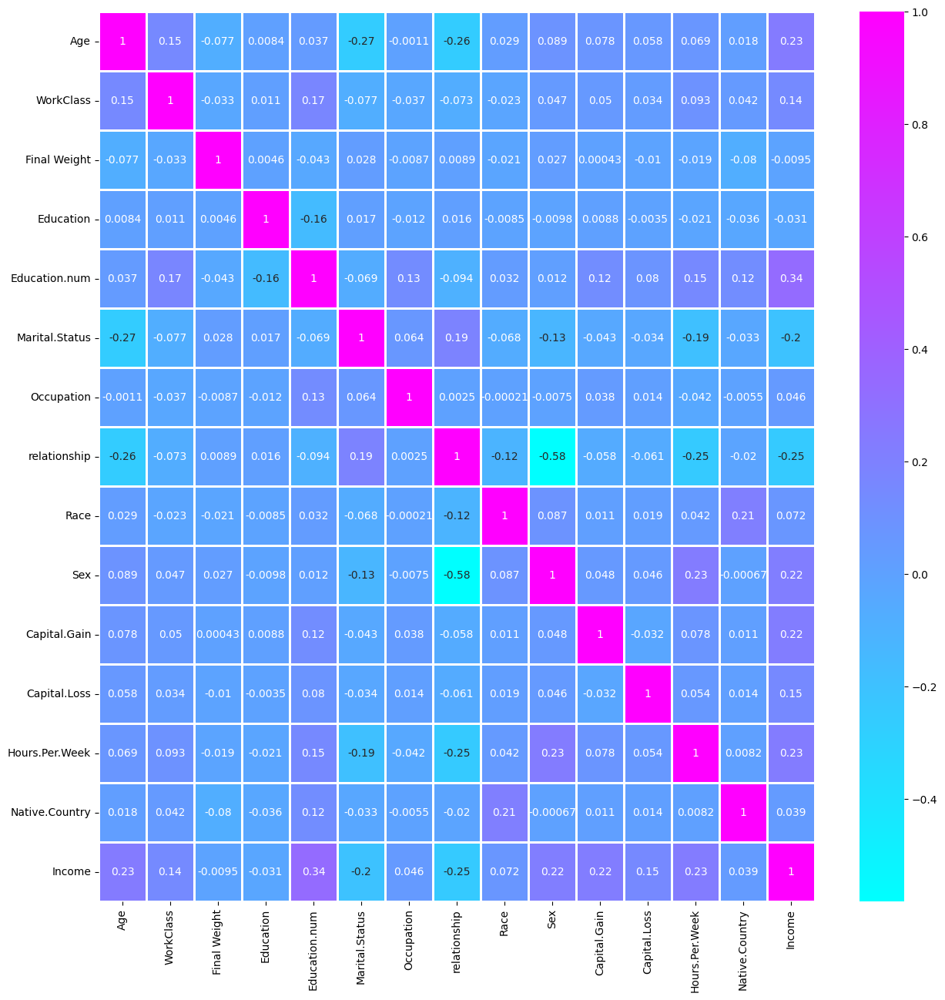

In [ ]:
plt.figure(figsize = (15, 15))
sns.heatmap(df.corr(), annot = True, cmap = "cool", linewidths=1.0)

**This command will display all the column names of the DataFrame df.**

In [ ]:
df.columns

Index(['Age', 'WorkClass', 'Final Weight', 'Education', 'Education.num',
       'Marital.Status', 'Occupation', 'relationship', 'Race', 'Sex',
       'Capital.Gain', 'Capital.Loss', 'Hours.Per.Week', 'Native.Country',
       'Income'],
      dtype='object')

# **Model Building**

**This code snippet selects specific features from the DataFrame df to create the feature set X and defines the target variable y as the "Income" column.**

In [ ]:
X = df[['Age', 'WorkClass', 'Final Weight', 'Education', 'Education.num',
       'Marital.Status', 'Occupation', 'relationship', 'Race', 'Sex',
       'Capital.Gain', 'Capital.Loss', 'Hours.Per.Week', 'Native.Country']]

y = df[["Income"]]

**This code applies Min-Max scaling to the feature set X and the target variable y, transforming their values to a range between 0 and 1. The set_output(transform="pandas") option ensures that the scaled data is returned as a Pandas DataFrame.**

In [ ]:
from sklearn.preprocessing import MinMaxScaler

Scaler_X = MinMaxScaler().set_output(transform = "pandas")

X = Scaler_X.fit_transform(X)

Scaler_y = MinMaxScaler().set_output(transform = "pandas")

y = Scaler_y.fit_transform(y)

**This code imports functions to split the dataset into training and testing subsets and to generate a classification report, which provides metrics like precision, recall, and F1-score for evaluating model performance.**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

**This code splits the dataset into training and testing sets, using 80% of the data for training (X_train and y_train) and the remaining 20% for testing (X_test and y_test).**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.80)

**1: A LogisticRegression model is instantiated with options to fit the intercept and use all available CPU cores.**

**2: The model is trained using the training data (X_train and y_train).**

**3: Predictions are made on the test set (X_test) and stored in y_pred.**

**4: A classification report is generated using classification_report, comparing predictions to the actual labels (y_test).**

**5: The classification report is printed, detailing metrics like precision, recall, and F1-score for each class.**

In [ ]:
from sklearn.linear_model import LogisticRegression

LogReg = LogisticRegression(fit_intercept=True, n_jobs = -1)

LogReg.fit(X_train, y_train)

y_pred = LogReg.predict(X_test)

CR = classification_report(y_pred, y_test)

print("Classfication Report For Logistic Regression: ")
print("")
print(CR)

Classfication Report For Logistic Regression: 

              precision    recall  f1-score   support

         0.0       0.94      0.85      0.89      5572
         1.0       0.43      0.70      0.54       941

    accuracy                           0.83      6513
   macro avg       0.69      0.77      0.71      6513
weighted avg       0.87      0.83      0.84      6513



**1: A RandomForestClassifier is created with 1000 estimators and a maximum depth of 1000, optimized for parallel processing.**

**2: The model is trained on the training data (X_train and y_train).**

**3: Predictions are generated for the test set (X_test) and stored in y_pred.**

**4: A classification report is produced by comparing the predictions to the actual labels (y_test).**

**5: The classification report is printed, highlighting metrics such as precision, recall, and F1-score for each class.**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

RFC = RandomForestClassifier(n_estimators=1000, max_depth=1000, n_jobs=-1)

RFC.fit(X_train, y_train)

y_pred = RFC.predict(X_test)

CR = classification_report(y_pred, y_test)

print("Classfication Report For Random Forest Classifier: ")
print("")
print(CR)

Classfication Report For Random Forest Classifier: 

              precision    recall  f1-score   support

         0.0       0.93      0.89      0.91      5224
         1.0       0.63      0.73      0.68      1289

    accuracy                           0.86      6513
   macro avg       0.78      0.81      0.79      6513
weighted avg       0.87      0.86      0.87      6513



**1: A DecisionTreeClassifier is instantiated with a maximum depth of 1000, minimum samples for splitting set to 50, and minimum samples per leaf set to 25.**

**2: The model is trained using the training data (X_train and y_train).**

**3: Predictions are made on the test set (X_test), resulting in y_pred.**

**4: A classification report is generated by comparing y_pred against the actual test labels (y_test).**

**5: The classification report is displayed, detailing precision, recall, and F1-score for each class.**

In [ ]:
from sklearn.tree import DecisionTreeClassifier

DTC = DecisionTreeClassifier(max_depth=1000, min_samples_split=50, min_samples_leaf=25)

DTC.fit(X_train, y_train)

y_pred = DTC.predict(X_test)

CR = classification_report(y_pred, y_test)

print("Classfication Report For Decision Tree Classifier: ")
print("")
print(CR)

Classfication Report For Decision Tree Classifier: 

              precision    recall  f1-score   support

         0.0       0.93      0.88      0.91      5260
         1.0       0.60      0.72      0.65      1253

    accuracy                           0.85      6513
   macro avg       0.76      0.80      0.78      6513
weighted avg       0.87      0.85      0.86      6513



**1: A ComplementNB classifier is created with a smoothing parameter (alpha) set to 1.0.**

**2: The model is trained on the training data (X_train and y_train).**

**3: Predictions are generated for the test set (X_test), resulting in y_pred.**

**4: A classification report is produced to evaluate the model's performance by comparing y_pred to the actual test labels (y_test).**

**5: The classification report is printed, showing metrics such as precision, recall, and F1-score for each class.**

In [ ]:
from sklearn.naive_bayes import ComplementNB

CNB = ComplementNB(alpha=1.0)

CNB.fit(X_train, y_train)

y_pred = CNB.predict(X_test)

CR = classification_report(y_pred, y_test)

print("Classification Report For ComplementNB: ")
print("")
print(CR)

Classification Report For ComplementNB: 

              precision    recall  f1-score   support

         0.0       0.63      0.93      0.75      3399
         1.0       0.83      0.40      0.54      3114

    accuracy                           0.68      6513
   macro avg       0.73      0.66      0.65      6513
weighted avg       0.73      0.68      0.65      6513



# **Deep Learning**

**Sequential Model: Initializes a linear stack of layers for the neural network.**

**Dense Layer: Adds fully connected layers, allowing the model to learn from the input data through weighted connections.**

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

**1: Model Architecture: The model consists of four layers: three hidden layers with ReLU activation and one output layer with a sigmoid activation function for binary classification.**

**2: Input Dimension: The input layer is configured to accept 14 features, allowing the model to learn patterns from the dataset effectively.**

**3: Layer Sizes: The hidden layers contain 1024, 512, and 256 neurons respectively, which helps in capturing complex relationships in the data.**

**4: Output Layer: The final layer outputs a single value between 0 and 1, representing the probability of the positive class in a binary classification task.**

**5: Model Summary: model.summary() provides a detailed overview of the model, including the number of parameters and the shape of each layer.**

In [ ]:
model = Sequential()

model.add(Dense(1024, activation = "relu", input_dim = 14))
model.add(Dense(512, activation = "relu"))
model.add(Dense(256, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 1024)           │        15,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 671,745 (2.56 MB)

 Trainable params: 671,745 (2.56 MB)

 Non-trainable params: 0 (0.00 B)

**1: Loss Function: The model uses "categorical_crossentropy," which is suitable for multi-class classification tasks where the target variable is one-hot encoded.**

**2: Optimizer: "Adam" is chosen for optimization, providing adaptive learning rates for improved convergence during training.**

**3: Metrics: The model tracks "accuracy" as a performance metric, allowing evaluation of how well the model classifies the input data.**

**4: Model Compilation: This step prepares the model for training by specifying the loss function, optimizer, and metrics to monitor.**

In [ ]:
model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics=["accuracy"])

**The model is trained using the training data for 100 epochs with a batch size of 128. A validation split of 20% is used to evaluate the model's performance during training. The training process is stored in the history variable for later analysis.**

In [ ]:
history = model.fit(X_train, y_train, epochs = 100, batch_size = 128, validation_split=0.20)

Epoch 1/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - accuracy: 0.7460 - loss: 0.0000e+00 - val_accuracy: 0.7522 - val_loss: 0.0000e+00
Epoch 2/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.7572 - loss: 0.0000e+00 - val_accuracy: 0.7522 - val_loss: 0.0000e+00
Epoch 3/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - accuracy: 0.7566 - loss: 0.0000e+00 - val_accuracy: 0.7522 - val_loss: 0.0000e+00
Epoch 4/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - accuracy: 0.7579 - loss: 0.0000e+00 - val_accuracy: 0.7522 - val_loss: 0.0000e+00
Epoch 5/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - accuracy: 0.7577 - loss: 0.0000e+00 - val_accuracy: 0.7522 - val_loss: 0.0000e+00
Epoch 6/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - accuracy: 0.7578 - loss: 0.0000e+00 - val_accuracy: 0.7522 - val_loss: 0.0000e+00
Epoch 7/100
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - accuracy: 0.7571 - loss: 0.0000e+00 - val_accuracy: 0.7522 - val_loss: 0.0000e+00
Epoch 8/100
163/163 ━━━━━━━━━━━━━━

**The code uses the trained model to predict the target variable on the test dataset (X_test) and stores the predictions in y_pred. It then generates and prints a classification report (CR) comparing the predicted values (y_pred) to the actual test labels (y_test), providing metrics like precision, recall, and F1-score.**

In [ ]:
y_pred = model.predict(X_test)

CR = classification_report(y_pred, y_test)

print("Classification Report For Deep Learning: ")
print("")
print(CR)

204/204 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Classification Report For Deep Learning: 

              precision    recall  f1-score   support

         0.0       1.00      0.77      0.87      6513
         1.0       0.00      0.00      0.00         0

    accuracy                           0.77      6513
   macro avg       0.50      0.38      0.43      6513
weighted avg       1.00      0.77      0.87      6513



**This code visualizes the training and validation loss over epochs, allowing you to assess the model's performance during training. By plotting both loss curves, you can identify potential overfitting or underfitting in the model.**

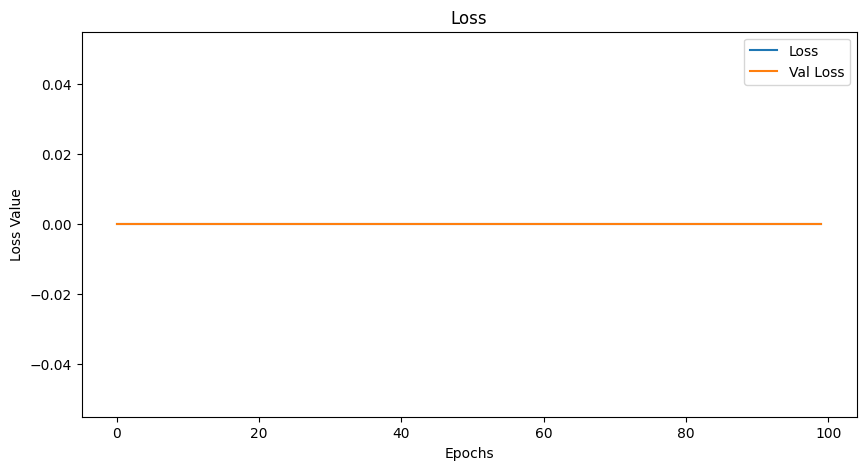

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(history.history["loss"], label='Loss')
plt.plot(history.history["val_loss"], label='Val Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss Value')
plt.legend()
plt.show()

**This code plots the training and validation accuracy over epochs, providing insights into the model's learning progress. By comparing these curves, you can evaluate how well the model generalizes to unseen data and detect any signs of overfitting or underfitting.**

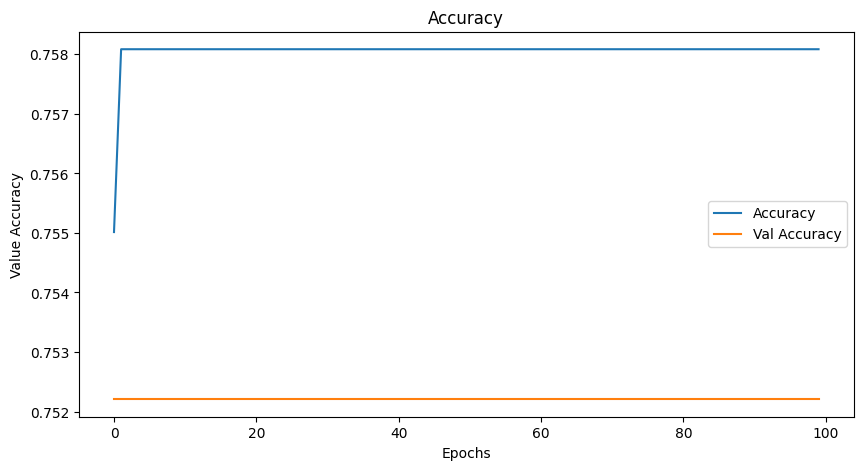

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(history.history["accuracy"], label='Accuracy')
plt.plot(history.history["val_accuracy"], label='Val Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Value Accuracy')
plt.legend()
plt.show()

# **Conclusion:**


**We evaluated multiple algorithms for our classification problem, including:**

**Logistic Regression:**
- **Precision: 0.94 for class 0.0, 0.43 for class 1.0**

**Random Forest Classifier:**
- **Precision: 0.93 for class 0.0, 0.63 for class 1.0**

**Decision Tree Classifier:**
- **Precision: 0.93 for class 0.0, 0.60 for class 1.0**

**ComplementNB:**
- **Precision: 0.63 for class 0.0, 0.83 for class 1.0**

## **Deep Learning:**
- **Precision: 1.00 for class 0.0, 0.00 for class 1.0**

**Among these, the Random Forest Classifier demonstrated the highest precision for the positive class (1.0) at 0.63, making it the most robust model for predictions. Therefore, we will choose the Random Forest Classifier for our future predictions.**

# **Save Model**

**This code serializes and saves the trained Random Forest Regression model ("RFR") into a ".pickle" file for future reuse without retraining.**

**This line stores the feature scaler ("Scaler_X") so that incoming input data is transformed in the exact same way as during training.**

In [ ]:
import pickle

with open("Finalized-Model.pickle", "wb") as file:
    pickle.dump(RFC, file)

with open("Scaler_X.pickle", "wb") as file:
    pickle.dump(Scaler_X, file)